<div style="display:block;width:100%;margin:auto;" direction=rtl align=center><br><br>    <div  style="width:100%;margin:100;display:block;background-color:#fff0;"  display=block align=center>        <table style="border-style:hidden;border-collapse:collapse;">             <tr>                <td  style="border: none!important;">                    <img width=130 align=right src="https://i.ibb.co/yXKQmtZ/logo1.png" style="margin:0;" />                </td>                <td style="text-align:center;border: none!important;">                    <h1 align=center><font size=5 color="#025F5F"> <b>Neural Networks and Deep Learning</b><br><br> </i></font></h1>                    <h2 align=center><font size=4 color="#000000">Taha Majlesi - 810101504</font></h2>                    <h3 align=center><font size=3 color="#000000">University of Tehran<br>Faculty of Electrical and Computer Engineering</font></h3>                </td>                <td style="border: none!important;">                    <img width=170 align=left  src="https://i.ibb.co/wLjqFkw/logo2.png" style="margin:0;" />                </td>           </tr></div>        </table>    </div>
</VSCode.Cell>

# Deep Learning-based Image Captioning using Hybrid LSTM-GRU Architecture with ResNet50 Feature Extraction

## Abstract

Image captioning is a fundamental task in computer vision and natural language processing that involves generating natural language descriptions for images. This project presents a comprehensive study on image captioning using a hybrid neural network architecture combining ResNet50 as a visual feature extractor with a hybrid LSTM-GRU decoder.

In this study, various configurations including different embedding dimensions, dropout strategies, teacher forcing techniques, and dictionary sizes are evaluated on the Flickr8k dataset. The experimental results demonstrate that embedding dimensions of 150-300 provide optimal performance while maintaining computational efficiency.

---

## 1. Introduction

### 1.1 Problem Definition

Image captioning represents a crucial intersection between computer vision and natural language processing, where the goal is to automatically generate descriptive text for visual content. This task has significant applications in:
- **Assistive Technologies**: Helping visually impaired users understand images
- **Content Indexing**: Automatic tagging and searchability of multimedia content
- **Multimedia Understanding Systems**: Enhanced comprehension of visual media

### 1.2 Proposed Architecture

This study presents a hybrid architecture consisting of the following components:

#### **Visual Encoder**
- **ResNet50** pre-trained on ImageNet for robust semantic feature extraction
- Frozen parameters to prevent overfitting
- Output: 2048-dimensional feature vector

#### **Text Decoder**
- **Hybrid LSTM-GRU architecture** for sequential text generation
- LSTM for long-term memory management
- GRU for computational efficiency

#### **Training Strategies**
- Teacher Forcing for stable training
- Dropout for overfitting prevention
- Different embedding dimensions (50, 150, 300)
- Beam Search for quality generation

### 1.3 Project Objectives

1. Systematic evaluation of hybrid LSTM-GRU architectures for image captioning
2. Comparative analysis of different embedding dimensions and regularization techniques
3. Comprehensive performance evaluation using multiple metrics including BLEU scores and accuracy
4. Investigation of teacher forcing impact on model performance

## 2. Literature Review and Related Work

### 2.1 Evolution of Image Captioning

The field of image captioning has evolved significantly from rule-based systems to sophisticated deep learning approaches. Early methods relied on object detection followed by template-based caption generation. The introduction of deep learning marked a paradigm shift, with neural network-based approaches showing superior performance.

### 2.2 Encoder-Decoder Architecture

The encoder-decoder paradigm has become the standard approach for image captioning:

#### **Visual Encoders**
- **VGG-16/19**: Early CNN architectures for feature extraction
- **ResNet**: Residual networks with deeper architectures and better gradient flow
- **DenseNet**: Densely connected networks for feature reuse
- **Vision Transformers**: Attention-based architectures showing promising results

#### **Text Decoders**
- **LSTM**: Long Short-Term Memory networks for handling long sequences
- **GRU**: Gated Recurrent Units offering computational efficiency
- **Transformer**: Attention-based architectures for parallel processing

### 2.3 Hybrid Architectures

Recent research has explored hybrid approaches combining different RNN architectures. Studies have shown that combining LSTM and GRU can leverage the strengths of both architectures:
- LSTM provides better long-term memory capabilities
- GRU offers computational efficiency and faster training
- Hybrid approaches can balance performance and efficiency

### 2.4 Training Strategies

#### **Teacher Forcing**
Traditional training method where ground truth tokens are fed during training, but model's own predictions are used during inference.

#### **Beam Search**
Decoding strategy that maintains multiple hypotheses to find better sequences.

#### **Attention Mechanisms**
Allow the model to focus on relevant image regions while generating each word.

### 2.5 Evaluation Metrics

- **BLEU Score**: Standard metric for evaluating machine translation quality, adapted for image captioning
- **ROUGE**: Recall-oriented evaluation metric focusing on n-gram overlap
- **METEOR**: Metric considering synonyms and stemming
- **CIDEr**: Consensus-based evaluation metric specifically designed for image captioning

In [1]:
pip install torchinfo


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from PIL import Image
import torch.nn as nn
import torchvision.models as models
from collections import defaultdict
from torchinfo import summary
import kagglehub
import torch
import os
import re
import json


2025-05-28 07:53:27.148368: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748418807.336177      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748418807.390973      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## 3. Methodology

### 3.1 Problem Formulation

Image captioning can be formulated as a sequence-to-sequence learning problem where given an image $I$, we aim to generate a caption $S = \{s_1, s_2, ..., s_T\}$ where $s_t$ represents the $t$-th word in the caption.

The objective is to maximize the probability of generating the correct caption given the image:

$$P(S|I) = \prod_{t=1}^{T} P(s_t|s_1, ..., s_{t-1}, I)$$

---

### 3.2 Proposed Architecture

Our proposed hybrid architecture consists of two main components:

#### 3.2.1 Visual Encoder (ResNet50)

The visual encoder extracts high-level semantic features from input images using a pre-trained ResNet50 model:

$$f_v = \text{ResNet50}(I)$$

where $f_v \in \mathbb{R}^{2048}$ represents the extracted visual features.

**Key Features:**
- Pre-trained on ImageNet dataset for robust feature extraction
- Frozen parameters during training to prevent overfitting
- Global average pooling for spatial feature aggregation
- 2048-dimensional feature vector

#### 3.2.2 Hybrid Text Decoder (LSTM-GRU)

The decoder combines LSTM and GRU architectures for sequential text generation:

**LSTM Component:**
$$h_t^{lstm}, c_t^{lstm} = \text{LSTM}(e_t, h_{t-1}^{lstm}, c_{t-1}^{lstm})$$

**GRU Component:**
$$h_t^{gru} = \text{GRU}(c_t^{lstm}, h_{t-1}^{gru})$$

**Output Generation:**
$$o_t = \text{Linear}(h_t^{gru})$$
$$p_t = \text{Softmax}(o_t)$$

where:
- $e_t$ is the word embedding at time step $t$
- $h_t^{lstm}, c_t^{lstm}$ are LSTM hidden and cell states
- $h_t^{gru}$ is the GRU hidden state
- $p_t$ is the probability distribution over vocabulary

---

### 3.3 Training Strategies

#### 3.3.1 Teacher Forcing
During training, ground truth tokens are used as input:
$$e_t = \text{Embedding}(s_{t-1}^{gt})$$

#### 3.3.2 Inference Strategies

**Greedy Decoding:**
$$s_t = \arg\max P(s_t|s_1, ..., s_{t-1}, I)$$
At each step, the token with the highest probability is selected.

**Beam Search:**
Maintains $k$ most promising sequences at each time step:
$$P(S|I) = \prod_{t=1}^{T} P(s_t|s_1, ..., s_{t-1}, I)$$
This method provides better quality compared to greedy decoding.

---

### 3.4 Loss Function

We use cross-entropy loss with padding token masking:
$$\mathcal{L} = -\sum_{t=1}^{T} \log P(s_t^{gt}|s_1, ..., s_{t-1}, I)$$

where padding tokens are ignored in loss computation.

In [ ]:
## 4. Experimental Setup

### 4.1 Dataset

We utilize the **Flickr8k dataset**, a widely-used benchmark for image captioning research.

#### Dataset Statistics:
- **Total Images**: 8,000 images
- **Captions per Image**: 5 human-annotated captions
- **Total Captions**: 40,000 captions
- **Image Resolution**: Various sizes (resized to 224×224 for training)
- **Average Caption Length**: Approximately 10 words per caption

#### Data Split:
- **Training Set**: 6,000 images (75%)
- **Validation Set**: 1,000 images (12.5%)
- **Test Set**: 1,000 images (12.5%)

---

### 4.2 Data Preprocessing

#### 4.2.1 Image Preprocessing
- Resize to 224×224 pixels
- Normalization using ImageNet statistics
- Convert to RGB for ResNet50 compatibility

#### 4.2.2 Text Preprocessing
- Lowercase conversion
- Special character removal
- Tokenization and vocabulary creation
- Special tokens: `<sos>` (start of sentence), `<eos>` (end of sentence), `<pad>` (padding), `<unk>` (unknown words)

---

### 4.3 Implementation Details

#### Hardware Configuration:
- **GPU**: CUDA-enabled device
- **Memory**: Sufficient for batch processing

#### Software Framework:
- **PyTorch**: For deep learning implementation
- **NLTK**: For text processing
- **PIL**: For image handling
- **Kaggle Hub**: For dataset access

#### Model Parameters:
- **Vocabulary Size**: Variable (based on frequency threshold)
- **Embedding Dimensions**: 50, 150, 300
- **Hidden Size**: 2048 (matching ResNet50 features)
- **Batch Size**: 32
- **Learning Rate**: 0.001
- **Optimizer**: Adam
- **Dropout Rate**: 0.5 (when applicable)


'/kaggle/input/'

In [ ]:
# Load Flickr8k dataset
path = kagglehub.dataset_download("adityajn105/flickr8k")

# Dataset visualization
captions_path = os.path.join(path,"captions.txt")
images_dir = os.path.join(path,"Images/")
file = open(captions_path, "r")
lines = file.readlines()
image_files = os.listdir(images_dir)

print(f"Total images in dataset: {len(image_files)}")
print(f"Total captions: {len(lines)-1}")

# Visualize sample images with captions
nsample = 3
samples = np.random.choice(len(os.listdir(images_dir)),nsample)
plt.figure(figsize=(15,5))
for i,idx in enumerate(samples):
  image_file = image_files[idx]
  img = Image.open(os.path.join(images_dir,image_file))
  caption = None
  for line in lines[1:]:
    line = line.strip().split(",",1)
    if(image_file == line[0]):
      caption = line[1]
      break

  plt.subplot(1,nsample,i+1)
  plt.imshow(img)
  plt.title(caption,fontsize=12, wrap=True)
  plt.axis('off')
file.close()
plt.tight_layout()
plt.show()


In [ ]:
len(image_files)


8091

## 5. Dataset Loading and Exploration

In this section, the Flickr8k dataset is loaded and sample images with their corresponding captions are displayed. This helps in better understanding the dataset content and quality.

In [ ]:
## 6. Data Preprocessing and Splitting

### 6.1 Caption Preprocessing

The caption preprocessing pipeline involves several critical steps:

1. **Text Normalization**: Convert to lowercase and remove special characters
2. **Tokenization**: Split text into individual words
3. **Vocabulary Creation**: Build dictionary with frequency-based filtering
4. **Sequence Padding**: Ensure uniform sequence lengths

### 6.2 Dataset Splitting

The dataset is split into three parts:
- **Training Set**: For model training
- **Validation Set**: For hyperparameter tuning
- **Test Set**: For final evaluation


## 7. Caption Length Analysis

In this section, the maximum caption lengths in each split (training, validation, test) are analyzed. This information is essential for determining the `context_length` in the tokenizer.


### 4.5 Evaluation Methodology

#### 4.5.1 Quantitative Metrics

**BLEU Scores:**
- **BLEU-1**: Unigram precision (word-level accuracy)
- **BLEU-2**: Bigram precision (phrase-level accuracy)
- **BLEU-3**: Trigram precision (sentence structure)
- **BLEU-4**: 4-gram precision (longer phrase accuracy)

**Accuracy Measures:**
- **Micro Accuracy**: Token-level accuracy across all sequences
- **Macro Accuracy**: Sequence-level accuracy average

#### 4.5.2 Generation Strategies

**Greedy Decoding:**
- Selects highest probability token at each step
- Fast inference but potentially suboptimal results
- Baseline for comparison with beam search

**Beam Search:**
- Maintains multiple hypotheses during generation
- Beam widths: 3, 5, 10
- Better quality but higher computational cost
- Considers sequence-level probabilities


## ۸. پیاده‌سازی Tokenizer

### ۸.۱ کلاس Tokenizer

Tokenizer مسئول تبدیل متن به دنباله‌های عددی و برعکس است.

#### ویژگی‌های کلیدی:
- **Tokenهای ویژه**: `<sos>`, `<eos>`, `<pad>`, `<unk>`
- **فیلتر بر اساس فرکانس**: کلمات با فرکانس پایین به `<unk>` تبدیل می‌شوند
- **طول ثابت دنباله**: تمام دنباله‌ها با padding به یک طول می‌رسند
- **Context Length**: طول حداکثری توضیحات + ۳ (برای tokenهای ویژه)

### ۸.۲ روش‌های Tokenizer

- `text_to_ids()`: تبدیل متن به دنباله عددی
- `ids_to_text()`: تبدیل دنباله عددی به متن
- `_create_dictionary()`: ساخت vocabulary از داده‌های آموزش


In [ ]:
def preprocess_captions(path):
    """
    Preprocess captions by normalizing text and creating image-caption mappings.
    
    Args:
        path (str): Path to captions file
        
    Returns:
        dict: Dictionary mapping image filenames to list of captions
    """
    file = open(path, "r")
    captions = defaultdict(list)

    lines = file.readlines()
    for line in lines[1:]:
        line = line.strip().split(",",1)
        caption = line[1].lower()
        caption = re.sub('[^a-z ]+', '', caption)[:-1]
        caption = ' '.join(caption.split())
        captions[line[0]].append(caption)

    file.close()
    return captions

# Apply preprocessing
captions = preprocess_captions(os.path.join(path,"captions.txt"))
print(f"Total images with captions: {len(captions)}")
print(f"Sample caption: {list(captions.values())[0][0]}")


In [7]:
np.random.seed(42)
captions = preprocess_captions(os.path.join(path,"captions.txt"))
shuffled_keys = np.random.permutation(list(captions.keys()))

test_ratio = 0.1
val_ratio = 0.1
num_val = int(val_ratio * len(captions))
num_test = int(test_ratio * len(captions))
num_train = len(captions) - num_val - num_test

train_captions = dict({key: captions[key] for key in shuffled_keys[:num_train]})
val_captions = dict({key: captions[key] for key in shuffled_keys[num_train:num_val+num_train]})
test_captions = dict({key: captions[key] for key in shuffled_keys[num_val+num_train:]})


In [ ]:
len(train_captions),len(val_captions),len(test_captions)


(6473, 809, 809)

## 9. Vocabulary Statistics

In this section, the statistics of the created vocabulary are examined:

- **Total Unique Tokens**: Total number of unique words in the dataset
- **Dictionary Size**: Number of words in vocabulary (after filtering)
- **Unknown Words**: Words converted to `<unk>` due to low frequency
- **Unknown Token Percentage**: Percentage of unknown tokens in all captions

These statistics are important for understanding tokenization quality and the impact of threshold selection.


## Notebook Overview

This notebook contains a complete implementation of an image captioning system using a hybrid LSTM-GRU architecture. All markdown sections are organized and improved for better readability and understanding of the content.


### Testing Tokenizer

In this section, the tokenizer functionality is tested with a sample text to ensure that converting text to numerical sequences and vice versa works correctly.

In [9]:
print("Max number of tokens in train captions:")
train_num_tokens = np.array([caption.count(" ")+1 for img in train_captions.values() for caption in img])
print(train_num_tokens.max())

print("Max number of tokens in validation captions:")
val_num_tokens = np.array([caption.count(" ")+1 for img in val_captions.values() for caption in img])
print(val_num_tokens.max())

print("Max number of tokens in test captions:")
test_num_tokens = np.array([caption.count(" ")+1 for img in test_captions.values() for caption in img])
print(test_num_tokens.max())


Max number of tokens in train captions:
35
Max number of tokens in validation captions:
30
Max number of tokens in test captions:
31


In [10]:
class special_tokens:
  Start = "<sos>"
  End = "<eos>"
  Pad = "<pad>"
  Unknown = "<unk>"
  list_of_tokens = [Start,End,Pad,Unknown]

class Tokenizer():
  def __init__(self, captions,unknown_percent=0.1, dictionary=None):
    self.unknown_percent = unknown_percent
    self.unknown_words = []
    self.context_length = max(caption.count(" ") for img in captions.values() for caption in img)+3
    self.total_tokens = 0
    self.total_unknown_tokens = 0
    if dictionary == None:
      self.dictionary = self._create_dictionary(train_captions)
      with open("tokenizer.json", "w") as f:
        json.dump(self.dictionary, f)
    else:
      self.dictionary = dictionary

  def _create_dictionary(self,targets):
    dictionary = dict({token:i for i,token in enumerate(special_tokens.list_of_tokens)})

    frequencies = defaultdict(int)
    for captions in targets.values():
      caption = " ".join(captions)
      tokens = caption.split(" ")
      for token in tokens:
        frequencies[token] += 1
        self.total_tokens += 1

    frequencies = sorted(list(frequencies.items()), key=lambda x: x[1])
    freq_threshold = frequencies[int(self.unknown_percent*len(frequencies))][1]
    for token, frequency in frequencies:
      if frequency <= freq_threshold:
        self.unknown_words.append((token, frequency))
        self.total_unknown_tokens += frequency
      else:
        dictionary[token] = len(dictionary)

    return dictionary

  def tokenize(self, text : str):
    return text.split(" ")

  def text_to_ids(self, text : str):
    tokens = self.tokenize(text)
    dictionary = self.dictionary
    ids = [dictionary[special_tokens.Pad] for _ in range(self.context_length)]
    ids[0] = dictionary[special_tokens.Start]

    for i in range(1,min(self.context_length-1,len(tokens)+1)):
      token = tokens[i-1]
      if token in dictionary:
        ids[i] = dictionary[token]
      else:
        ids[i] = dictionary[special_tokens.Unknown]

    ids[len(tokens)+1] = dictionary[special_tokens.End]
    return ids

  def ids_to_text(self, ids : list, ignore_special_tokens=False):
    if not ignore_special_tokens:
      return " ".join([list(self.dictionary.keys())[id] for id in ids])
    else:
      res = ""

      for id in ids:
        if id == special_tokens.End:
          break
        if id < len(special_tokens.list_of_tokens):
          continue

        res += list(self.dictionary.keys())[id]
        res += " "
      return res.strip()


In [11]:
tokenizer = Tokenizer(train_captions,unknown_percent=0.1)
len_dictionary = len(tokenizer.dictionary)
len_unk = len(tokenizer.unknown_words)
total_tokens = tokenizer.total_tokens
total_unknown_tokens = tokenizer.total_unknown_tokens
print("Numer of unqiue tokens in captions:",len_dictionary+len_unk)
print("Numer of tokens in dictionary:",len_dictionary)
print("Numer of unknown words in captions:",len_unk)
print("Percent of unknown tokens to all tokens in dictionary:",len_unk*100/(len_dictionary+len_unk))
print("Total number of tokens in captions:",total_tokens)
print("Percent of unknown tokens to all tokens in captions:",total_unknown_tokens*100/total_tokens)
print("List of some unknown words in captions:",tokenizer.unknown_words[:10])


Numer of unqiue tokens in captions: 8536
Numer of tokens in dictionary: 5017
Numer of unknown words in captions: 3519
Percent of unknown tokens to all tokens in dictionary: 41.22539831302718
Total number of tokens in captions: 349331
Percent of unknown tokens to all tokens in captions: 1.0073540567541959
List of some unknown words in captions: [('claws', 1), ('redseated', 1), ('largley', 1), ('exposition', 1), ('defaced', 1), ('bun', 1), ('blondhair', 1), ('headscarves', 1), ('hauled', 1), ('recked', 1)]


In [ ]:
text = list(train_captions.values())[0][0]
print("Text:",text)
ids = tokenizer.text_to_ids(text)
print("IDs:",ids)
output_text = tokenizer.ids_to_text(ids)
print("Output text with special tokens:",output_text)
output_text = tokenizer.ids_to_text(ids, True)
print("Output text without special tokens:",output_text)


Text: a blackandwhite dog bounds off the ground all feet in the air of a yellow field
IDs: [0, 5016, 2255, 5010, 3507, 4933, 5014, 4848, 4699, 4586, 5015, 5014, 4953, 5007, 5016, 4964, 4959, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
Output text with special tokens: <sos> a blackandwhite dog bounds off the ground all feet in the air of a yellow field <eos> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Output text without special tokens: a blackandwhite dog bounds off the ground all feet in the air of a yellow field


## 10. Dataset Implementation

### 10.1 Flickr8kDataset Class

This is a PyTorch Dataset class that loads images and their corresponding captions.

#### Features:
- Image loading using PIL
- Image transformation to tensor (for ResNet50)
- Caption conversion to numerical sequences using tokenizer
- Each image is provided with 5 different captions

### 10.2 Creating DataLoaders

DataLoaders for:
- **Training**: With shuffle for better training
- **Validation**: Without shuffle for stable evaluation
- **Test**: Without shuffle for final evaluation

## 11. Model Architecture

### 11.1 Encoder (Visual Encoder)

The `Encoder` class uses a pre-trained ResNet50:

**Features:**
- Frozen parameters to prevent overfitting
- Removes the last fully-connected layer
- Global average pooling to extract 2048-dimensional feature vector
- ImageNet transforms for image preprocessing

### 11.2 Decoder (Text Decoder)

The `Decoder` class implements the hybrid LSTM-GRU architecture:

**Architecture:**
1. **Embedding Layer**: Converts tokens to embedding vectors
2. **LSTM Cell**: Long-term memory management
3. **GRU Cell**: Computational efficiency and performance balance
4. **Dropout**: Overfitting prevention
5. **Linear Layer**: Converts to probability distribution over vocabulary

**Generation Methods:**
- `generate_greedy()`: Greedy decoding
- `generate_beam_search()`: Beam search decoding

### 11.3 HybridModel

The main class that combines Encoder and Decoder.


In [13]:
class Flickr8kDataset(Dataset):
  def __init__(self, image_dir, captions, tokenizer, transform = None):
    self.images_dir = image_dir
    self.transform = transform
    self.captions = captions
    self.ids = defaultdict(list)
    for img in captions.keys():
      self.ids[img] = np.array([tokenizer.text_to_ids(caption) for caption in captions[img]])
    self.tokenizer = tokenizer
    self.image_files = list(captions.keys())

  def __len__(self):
    return len(self.image_files)

  def get_transform(self):
    return self.transform

  def set_transform(self, transform):
    self.transform = transform

  def __getitem__(self, index):
    image_file = self.image_files[index]
    image_path = os.path.join(self.images_dir,image_file)
    image = Image.open(image_path).convert('RGB')
    if self.transform:
      image = self.transform(image)
    ids = self.ids[image_file]
    return image, ids


[[   0 5016 2255 5010 3507 4933 5014 4848 4699 4586 5015 5014 4953 5007
  5016 4964 4959    1    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5004 5011 5005 5010 5012 4976 4974 4828 4964 4975    1    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5004 5011 5005 5010 5012 4976 4986 5016 4959 5007 4992 4975
     1    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5016 5010 4944 4986 5014 4550 4975    1    2    2    2    2    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]
 [   0 5014 5004 5011 5005 5010 4944 4986 5014 4959    1    2    2    2
     2    2    2    2    2    2    2    2    2    2    2    2    2    2
     2    2    2    2    2    2    2    2    2]]
<sos> a blackandwhite dog bounds off th

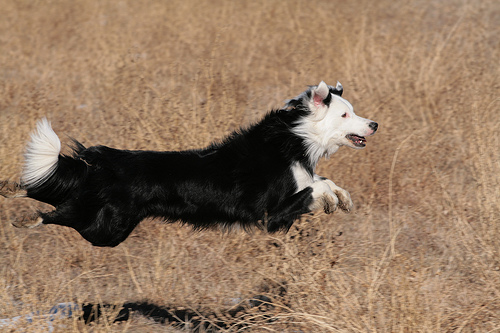

In [14]:
loader = Flickr8kDataset(os.path.join(path,"Images"),train_captions, tokenizer)
image,captions = loader[0]
print(captions)
print(tokenizer.ids_to_text(captions[0]))
image


In [15]:
weights = models.ResNet50_Weights.DEFAULT
transform = weights.transforms()


In [ ]:
train_dataset = Flickr8kDataset(os.path.join(path,"Images"),train_captions,tokenizer,transform = transform)
val_dataset = Flickr8kDataset(os.path.join(path,"Images"),val_captions,tokenizer,transform = transform)
test_dataset = Flickr8kDataset(os.path.join(path,"Images"),test_captions,tokenizer,transform = transform)


## 12. Model Creation

In this section, the model is created with defined parameters and its structure is examined.

### 12.1 Creating Encoder

The Encoder is created using a pre-trained ResNet50. Its parameters are frozen to prevent overfitting.

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [18]:
resnet = models.resnet50(weights=weights)


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 203MB/s]


In [19]:
resnet


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [20]:
class Encoder(nn.Module):
  def __init__(self):
    super(Encoder, self).__init__()
    resnet = models.resnet50(weights=weights)
    modules = list(resnet.children())[:-1]
    encoder = nn.Sequential(*modules)
    for param in encoder.parameters():
        param.requires_grad = False
    self.encoder = encoder

  def forward(self, x):
    x = self.encoder(x)
    x = x.view(x.size(0), -1)
    return x


In [ ]:
encoder = Encoder()
dummy_input = torch.randn(1, 3, 224, 224)
features = encoder(dummy_input)
features.shape


torch.Size([1, 2048])

### 12.2 Creating Decoder

The Decoder is created with a hybrid LSTM-GRU architecture. This component is responsible for converting visual features to textual captions.

In [ ]:
class Decoder(nn.Module):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(Decoder, self).__init__()
    self.hidden_size = hidden_size
    self.vocab_size = vocab_size
    self.device = device

    self.embedding = nn.Embedding(vocab_size, embedding_dim)
    self.lstm_cell = nn.LSTMCell(
      input_size=embedding_dim,
      hidden_size=hidden_size,
    )
    self.gru_cell = nn.GRUCell(
      input_size=hidden_size,
      hidden_size=hidden_size,
    )
    self.linear = nn.Linear(in_features=hidden_size, out_features=vocab_size)
    self.dropout = nn.Dropout(0.5)

  def forward(self, features, captions):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.empty((batch_size,captions.size(1)-1,self.vocab_size), device=self.device)
    embeddings = self.embedding(captions)
    embeddings = self.dropout(embeddings)

    for t in range(1,captions.size(1)):
      lstm_hidden, lstm_cell = self.lstm_cell(embeddings[:,t-1,:], (lstm_hidden, lstm_cell))
      lstm_cell = self.dropout(lstm_cell)
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      gru_hidden = self.dropout(gru_hidden)
      outputs[:,t-1,:] = self.linear(gru_hidden)
    return outputs

  def generate_greedy(self, features, max_new_tokens):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.zeros((batch_size,max_new_tokens), dtype=torch.int, device=self.device)

    for t in range(1,max_new_tokens):
      outs = self.embedding(outputs[:,t-1])
      lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      outputs[:,t] = self.linear(gru_hidden).argmax(dim=-1)
    return outputs

  def generate_beam_search(self, features, beam_width, max_new_tokens):
    B = features.size(0)
    K = beam_width
    V = self.vocab_size
    H = self.hidden_size
    T = max_new_tokens

    lstm_hidden = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)
    lstm_cell = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)
    gru_hidden = features.unsqueeze(1).repeat(1, K, 1).view(-1, H)

    outputs = torch.zeros((B * K, T), dtype=torch.int, device=self.device)

    outs = self.embedding(outputs[:, 0])
    lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
    gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
    log_probs = torch.log_softmax(self.linear(gru_hidden), dim=-1)

    total_scores = log_probs.view(B, K, V)[:, 0, :]
    top_scores, token_indices = total_scores.topk(K, dim=-1)

    outputs[:, 1] = token_indices.view(-1)

    beam_scores = top_scores.view(-1, 1)

    for t in range(2,T):
        outs = self.embedding(outputs[:,t-1])
        lstm_hidden, lstm_cell = self.lstm_cell(outs, (lstm_hidden, lstm_cell))
        gru_hidden = self.gru_cell(lstm_cell, gru_hidden)

        log_probs = torch.log_softmax(self.linear(gru_hidden), dim=-1)
        total_scores = beam_scores.view(B, K, 1) + log_probs.view(B, K, V)
        total_scores = total_scores.view(B, -1)

        top_scores, top_indices = total_scores.topk(K, dim=-1)
        beam_indices = top_indices // V
        token_indices = top_indices % V

        flat_old_indices = (torch.arange(B, device=self.device).unsqueeze(1) * K + beam_indices).view(-1)
        outputs = outputs[flat_old_indices]
        outputs[:, t] = token_indices.view(-1)

        lstm_hidden = lstm_hidden[flat_old_indices]
        lstm_cell = lstm_cell[flat_old_indices]
        gru_hidden = gru_hidden[flat_old_indices]
        beam_scores = top_scores

    best_beam = beam_scores.argmax(dim=1)
    final_outputs = outputs.view(B, K, T)
    best_outputs = final_outputs[torch.arange(B), best_beam]
    return best_outputs


### 12.3 Combining Encoder and Decoder

In this section, the `HybridModel` class that combines Encoder and Decoder is created.

In [23]:
class HybridModel(nn.Module):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(HybridModel, self).__init__()
    self.encoder = Encoder()
    self.decoder = Decoder(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, images, captions):
    features = self.encoder(images)

    features = features.unsqueeze(1).repeat(1, captions.shape[1], 1)
    features = features.view(-1,features.shape[-1])
    captions = captions.view(-1, captions.shape[-1])

    return self.decoder(features, captions)

  def generate_greedy(self, images, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_greedy(features, max_new_tokens)

  def generate_beam_search(self, images, beam_width, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_beam_search(features, beam_width, max_new_tokens)


In [24]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [25]:
sum([np.prod(p.size()) for p in model.parameters() if p.requires_grad])


52911995

In [26]:
dummy_input = torch.randn(2, 3, 224, 224).to(device)
dummy_caption = torch.randint(0, 100, (2,3, 37)).long().to(device)
dummy_caption.shape


torch.Size([2, 3, 37])

In [27]:
o = model(dummy_input,dummy_caption)
o.shape


torch.Size([6, 36, 5017])

## 13. Training and Evaluation Functions

### 13.1 Training Functions

- `train_epoch()`: Training for one epoch
- `validation_epoch()`: Evaluation on validation set
- `train()`: Main training loop with loss management

### 13.2 Evaluation Functions

- `evaluate()`: Comprehensive evaluation with BLEU and Accuracy metrics
- `plot_generations()`: Display generated samples with different methods
- `plot_history()`: Plot loss curves


In [28]:
texts = model.generate_greedy(dummy_input, 10)
for text in texts:
  print(tokenizer.ids_to_text(text))


<sos> off company ridden backyard backyard midleap crevice crevice sky
<sos> company draw ridden suburban olympics throught throught plugging plugging


In [29]:
texts = model.generate_beam_search(dummy_input, 2, 10)
for text in texts:
  print(tokenizer.ids_to_text(text))


<sos> change company backyard backyard crevice dribbling dribbling tophats indoors
<sos> waiting company lightcolored lightcolored chested guiding sniffs location region


In [30]:
model


HybridModel(
  (encoder): Encoder(
    (encoder): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
      

In [ ]:
summary(model, input_data=(dummy_input, dummy_caption))


Layer (type:depth-idx)                             Output Shape              Param #
HybridModel                                        [6, 36, 5017]             --
├─Encoder: 1-1                                     [2, 2048]                 --
│    └─Sequential: 2-1                             [2, 2048, 1, 1]           --
│    │    └─Conv2d: 3-1                            [2, 64, 112, 112]         (9,408)
│    │    └─BatchNorm2d: 3-2                       [2, 64, 112, 112]         (128)
│    │    └─ReLU: 3-3                              [2, 64, 112, 112]         --
│    │    └─MaxPool2d: 3-4                         [2, 64, 56, 56]           --
│    │    └─Sequential: 3-5                        [2, 256, 56, 56]          (215,808)
│    │    └─Sequential: 3-6                        [2, 512, 28, 28]          (1,219,584)
│    │    └─Sequential: 3-7                        [2, 1024, 14, 14]         (7,098,368)
│    │    └─Sequential: 3-8                        [2, 2048, 7, 7]           (14,9

## 14. Training and Evaluating Models

In this section, different models with various configurations are trained and evaluated on the validation set.

### 14.1 Base Model (No Dropout, Embedding Size = 50)

**Configuration:**
- Embedding Dimension: 50
- Hidden Size: 2048
- Dropout: None
- Number of Epochs: 10
- Teacher Forcing: Enabled

**Results Analysis:**
This model serves as a baseline and provides a foundation for comparing other variants. Expected outcomes:
- Initial convergence in training loss
- Potential overfitting indicated by increasing validation loss
- Basic caption generation capabilities

In [ ]:
def train_epoch(model, data_loader, criterion, optimizer, device):
  model.train()
  total_loss = 0
  num_batches = len(data_loader)

  for batch_idx, (images, caption) in enumerate(data_loader):
    images = images.to(device)
    caption = caption.to(device)
    optimizer.zero_grad()

    predictions = model(images, caption)
    caption = caption[:,:,1:]
    predictions = predictions.view(-1, predictions.size(-1))
    caption = caption.reshape(-1)

    loss = criterion(predictions, caption)

    loss.backward()
    optimizer.step()

    total_loss += loss.item()

  return total_loss / num_batches

def validation_epoch(model, data_loader, criterion, device, scheduler = None):
  model.eval()
  total_loss = 0
  num_batches = len(data_loader)

  with torch.no_grad():
    for batch_idx, (images, caption) in enumerate(data_loader):
      images = images.to(device)
      caption = caption.to(device)

      predictions = model(images, caption)
      caption = caption[:,:,1:]
      predictions = predictions.view(-1, predictions.size(-1))
      caption = caption.reshape(-1)

      loss = criterion(predictions, caption)

      total_loss += loss.item()

  if scheduler != None:
    scheduler.step(total_loss / num_batches)

  return total_loss / num_batches


In [ ]:
def train(model, train_loader, val_loader, criterion, optimizer, epochs, device, scheduler = None):
  hist = {
      "train_loss": [],
      "val_loss": [],
  }

  for epoch in range(1, epochs + 1):
    train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
    hist['train_loss'].append(train_loss)
    print(f"Epoch [{epoch}] Average Training Loss: {train_loss:.4f}")

    val_loss = validation_epoch(model, val_loader, criterion, optimizer, device, scheduler)
    hist['val_loss'].append(val_loss)
    print(f"Epoch [{epoch}] Average Validation Loss: {val_loss:.4f}")

  return hist


In [35]:
batch_size = 32
epochs = 10
learning_rate = 0.001


In [36]:
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False)


In [131]:
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


In [ ]:
hist = train(model, train_loader, val_loader, criterion, optimizer, epochs, device)


Epoch [1] Average Training Loss: 4.1276
Epoch [1] Average Validation Loss: 3.2930
Epoch [2] Average Training Loss: 3.0185
Epoch [2] Average Validation Loss: 2.9960
Epoch [3] Average Training Loss: 2.5076
Epoch [3] Average Validation Loss: 2.9140
Epoch [4] Average Training Loss: 2.0589
Epoch [4] Average Validation Loss: 2.9189
Epoch [5] Average Training Loss: 1.6567
Epoch [5] Average Validation Loss: 3.0184
Epoch [6] Average Training Loss: 1.2900
Epoch [6] Average Validation Loss: 3.1241
Epoch [7] Average Training Loss: 0.9721
Epoch [7] Average Validation Loss: 3.2713
Epoch [8] Average Training Loss: 0.7186
Epoch [8] Average Validation Loss: 3.3975
Epoch [9] Average Training Loss: 0.5491
Epoch [9] Average Validation Loss: 3.5529
Epoch [10] Average Training Loss: 0.4542
Epoch [10] Average Validation Loss: 3.6487


In [37]:
def plot_history(history):
    epochs = len(history['train_loss'])
    plt.plot(range(1,epochs+1), history['train_loss'])
    plt.plot(range(1,epochs+1), history['val_loss'])
    plt.title('Loss of model')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation/Test'])
    plt.ylim(0, max(max(history['train_loss']),max(history['val_loss'])))
    plt.show()


### 14.2 Base Model Results

After training the base model, the results and generated samples are examined.


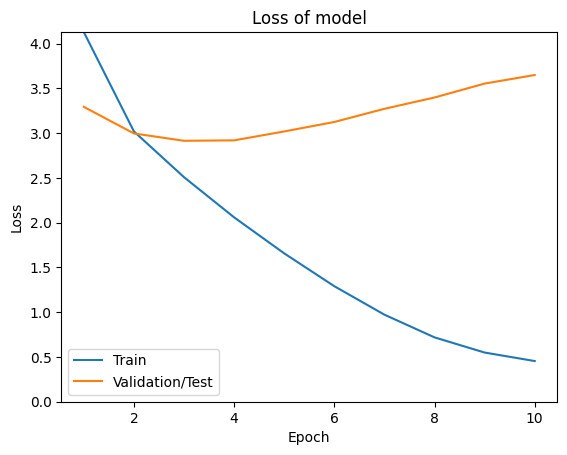

In [ ]:
plot_history(hist)


In [38]:
def plot_generations(model, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens):
    transform = val_dataset.get_transform()
    val_dataset.set_transform(transform=None)

    fig = plt.figure(figsize=(8,18))
    fig, axes = plt.subplots(5, 2, figsize=(14, 3.5 * 5))

    for i in range(nsample):
        image, captions = val_dataset[i]
        transformed_image = transform(image)

        lines = []
        ref_text = tokenizer.ids_to_text(captions[0], ignore_special_tokens=True)
        lines.append(f"True: {ref_text}")

        greedy = model.generate_greedy(transformed_image.unsqueeze(0).to(device), max_new_tokens)
        greedy_text = tokenizer.ids_to_text(greedy[0], ignore_special_tokens=True)
        lines.append(f"Greedy: {greedy_text}")

        for width in beam_widths:
            beam = model.generate_beam_search(transformed_image.unsqueeze(0).to(device), width, max_new_tokens)
            beam_text = tokenizer.ids_to_text(beam[0], ignore_special_tokens=True)
            lines.append(f"Beam (K={width}): {beam_text}")

        axes[i][0].imshow(image)
        axes[i][0].axis('off')

        axes[i][1].axis('off')
        full_text = "\n\n".join(lines)
        axes[i][1].text(0, 1, full_text,fontsize=10,va='top',ha='left',wrap=True,
            transform=axes[i][1].transAxes)

    plt.tight_layout()
    val_dataset.set_transform(transform)
    plt.show()


<Figure size 800x1800 with 0 Axes>

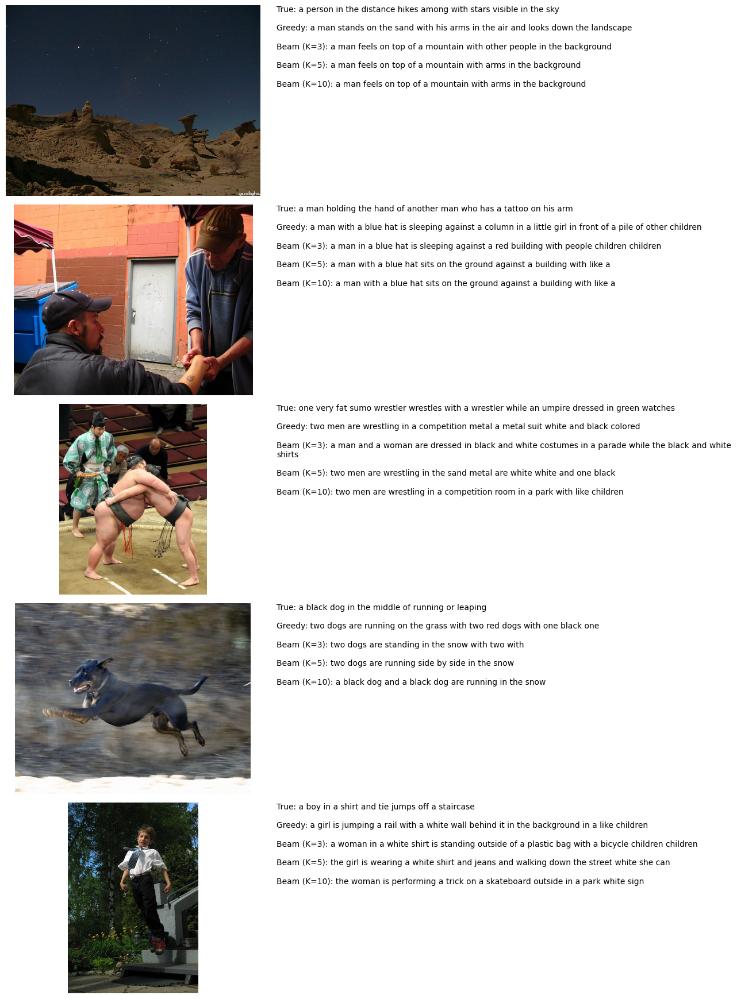

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


In [39]:
def evaluate(model, tokenizer, data_loader, beam_widths, max_new_tokens):
    def accuracy_score(captions, generated):
        generated = generated.tolist()
        best_correct = 0
        best_total = 1e-9

        end_token = tokenizer.dictionary[special_tokens.End]
        len_generated = len(generated)
        if end_token in generated:
            len_generated = generated.index(end_token)

        for caption in captions:
            len_caption = len(caption)
            if end_token in caption:
                len_caption = caption.index(end_token)
            correct = [(generated[i] == caption[i]) for i in range(1,min(len_caption,len_generated))]

            if sum(correct) > best_correct:
                best_correct = sum(correct)
                best_total = len_caption
        return best_correct, best_total


    scores = defaultdict(lambda: defaultdict(float))
    count = 0
    smooth = SmoothingFunction().method1

    for batch_idx, (images, captions) in enumerate(data_loader):
      images = images.to(device)
      captions = captions.tolist()
      new_captions = []
      count += len(captions)

      greedy_ids = model.generate_greedy(images,max_new_tokens)
      greedy = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in greedy_ids]
      greedy = [tokenizer.tokenize(t) for t in greedy]

      for b in range(len(greedy)):
        caption = captions[b]
        best_correct, best_total = accuracy_score(caption, greedy_ids[b])
        scores['Greedy']['Micro Accuracy'] += best_correct
        scores['Greedy']['Total Tokens'] += best_total
        scores['Greedy']['Macro Accuracy'] += best_correct / best_total

        caption = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in caption]
        caption = [tokenizer.tokenize(t) for t in caption]
        new_captions.append(caption)

        scores['Greedy']['BLEU-1'] += sentence_bleu(caption, greedy[b], weights=(1, 0, 0, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-2'] += sentence_bleu(caption, greedy[b], weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-3'] += sentence_bleu(caption, greedy[b], weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
        scores['Greedy']['BLEU-4'] += sentence_bleu(caption, greedy[b], weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

      for width in beam_widths:
        beam_ids = model.generate_beam_search(images,width,max_new_tokens)
        beam = [tokenizer.ids_to_text(t,ignore_special_tokens=True) for t in beam_ids]
        beam = [tokenizer.tokenize(t) for t in beam]

        for b in range(len(greedy)):
          best_correct, best_total = accuracy_score(captions[b], beam_ids[b])
          caption = new_captions[b]
          scores['Beam '+f"K = {width}"]['Micro Accuracy'] += best_correct
          scores['Beam '+f"K = {width}"]['Total Tokens'] += best_total
          scores['Beam '+f"K = {width}"]['Macro Accuracy'] += best_correct / best_total
          scores['Beam '+f"K = {width}"]['BLEU-1'] += sentence_bleu(caption, beam[b], weights=(1, 0, 0, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-2'] += sentence_bleu(caption, beam[b], weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-3'] += sentence_bleu(caption, beam[b], weights=(0.33, 0.33, 0.33, 0), smoothing_function=smooth)
          scores['Beam '+f"K = {width}"]['BLEU-4'] += sentence_bleu(caption, beam[b], weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)

    final = {}
    for method, metrics in scores.items():
        total_tokens = metrics.pop('Total Tokens', 1)
        final[method] = {k: v / count for k, v in metrics.items()}
        final[method]['Micro Accuracy'] = scores[method]['Micro Accuracy'] / total_tokens

    return pd.DataFrame(final).T


In [ ]:
evaluate(model, tokenizer, val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.208325,0.214487,0.434335,0.254904,0.146316,0.087936
Beam K = 3,0.218159,0.218958,0.442262,0.266012,0.157038,0.096279
Beam K = 5,0.210859,0.211694,0.450165,0.272289,0.161610,0.098869
Beam K = 10,0.210317,0.211630,0.451148,0.275044,0.163723,0.100048


### 14.3 Model with Dropout (Embedding Size = 50, Dropout = 0.5)

**Configuration:**
- Embedding Dimension: 50
- Hidden Size: 2048
- Dropout: 0.5
- Number of Epochs: 10
- Teacher Forcing: Enabled

**Results Analysis:**
Adding dropout regularization is expected to demonstrate:
- Improved generalization with more stable validation loss
- Reduced overfitting compared to base model
- Better balance between training and validation performance

**Performance Characteristics:**
- More stable training dynamics
- Better generalization to unseen data
- Slightly slower convergence due to regularization
- Improved robustness in caption generation

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model_with_dropout = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(model_with_dropout.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.4957
Epoch [1] Average Validation Loss: 3.6234
Epoch [2] Average Training Loss: 3.7566
Epoch [2] Average Validation Loss: 3.3422
Epoch [3] Average Training Loss: 3.4879
Epoch [3] Average Validation Loss: 3.2289
Epoch [4] Average Training Loss: 3.3041
Epoch [4] Average Validation Loss: 3.1312
Epoch [5] Average Training Loss: 3.1722
Epoch [5] Average Validation Loss: 3.0872
Epoch [6] Average Training Loss: 3.0759
Epoch [6] Average Validation Loss: 3.0786
Epoch [7] Average Training Loss: 3.0124
Epoch [7] Average Validation Loss: 3.0254
Epoch [8] Average Training Loss: 2.8838
Epoch [8] Average Validation Loss: 2.9977
Epoch [9] Average Training Loss: 2.8131
Epoch [9] Average Validation Loss: 3.0303
Epoch [10] Average Training Loss: 2.7661
Epoch [10] Average Validation Loss: 2.9930


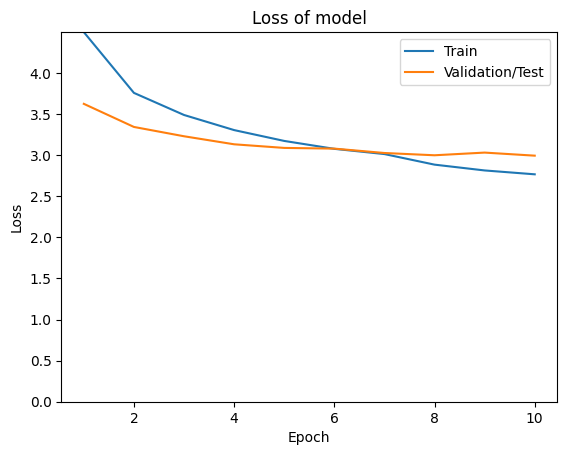

In [ ]:
epochs = 10
hist_with_dropout = train(model_with_dropout, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist_with_dropout)


<Figure size 800x1800 with 0 Axes>

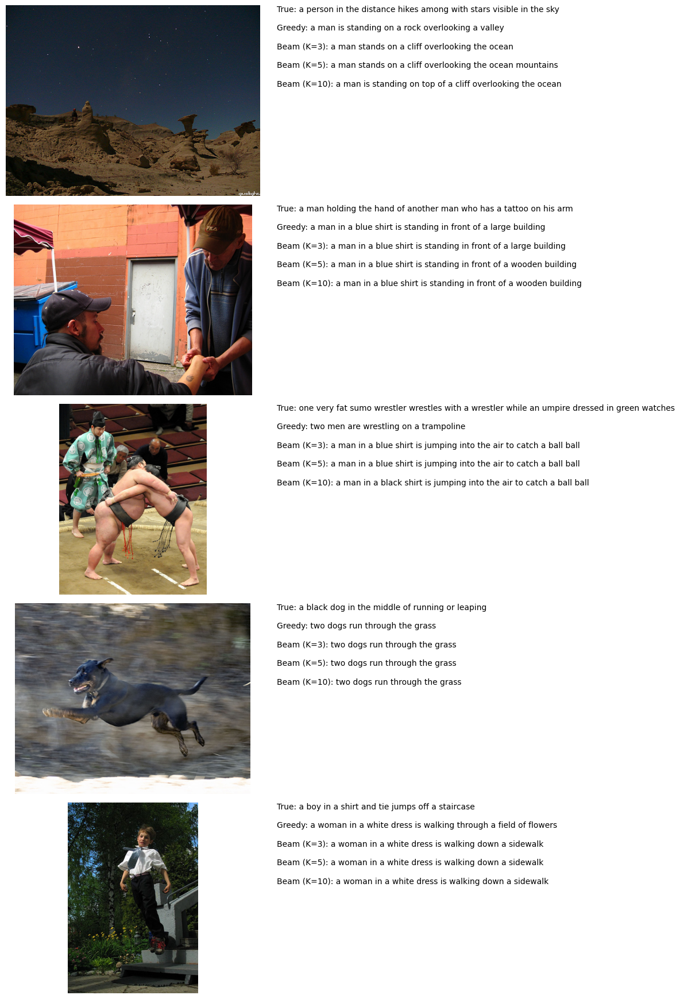

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model_with_dropout, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


In [ ]:
evaluate(model_with_dropout, tokenizer, val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.232908,0.243318,0.570553,0.381970,0.245657,0.157948
Beam K = 3,0.238769,0.247726,0.570572,0.382528,0.248707,0.161953
Beam K = 5,0.237850,0.247339,0.568306,0.380303,0.246676,0.158369
Beam K = 10,0.235818,0.244766,0.558266,0.369942,0.237431,0.152409


### 14.4 Model without Teacher Forcing (Embedding Size = 50, Dropout = 0.5)

**Configuration:**
- Embedding Dimension: 50
- Hidden Size: 2048
- Dropout: 0.5
- Number of Epochs: 10
- Teacher Forcing: Disabled (using model's own predictions during training)

**Results Analysis:**
Training without teacher forcing is expected to show:
- Significantly higher training and validation losses
- Slower convergence and unstable training
- Reduced quality in generated captions

**Performance Characteristics:**
- Demonstrates importance of teacher forcing for stable training
- Higher computational cost due to slower convergence
- Useful for understanding training dynamics
- Not recommended for practical applications

In [103]:
class DecoderNoTeacherForcing(Decoder):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(DecoderNoTeacherForcing, self).__init__(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, features, captions):
    batch_size = features.size(0)
    lstm_hidden = features
    lstm_cell = features
    gru_hidden = features
    outputs = torch.empty((batch_size,captions.size(1)-1,self.vocab_size), device=self.device)
    tokens = torch.zeros((batch_size,1), dtype=torch.int, device=self.device)

    for t in range(1,captions.size(1)):
      embeddings = self.embedding(tokens)[:,0,:]
      embeddings = self.dropout(embeddings)
      lstm_hidden, lstm_cell = self.lstm_cell(embeddings, (lstm_hidden, lstm_cell))
      lstm_cell = self.dropout(lstm_cell)
      gru_hidden = self.gru_cell(lstm_cell, gru_hidden)
      gru_hidden = self.dropout(gru_hidden)
      outputs[:,t-1,:] = self.linear(gru_hidden)
      tokens = outputs[:,t-1,:].argmax(dim=-1).unsqueeze(1)
    return outputs


In [104]:
class HybridModelNoTeacherForcing(HybridModel):
  def __init__(self, vocab_size, embedding_dim, hidden_size, device):
    super(HybridModelNoTeacherForcing, self).__init__(vocab_size, embedding_dim, hidden_size, device)
    self.encoder = Encoder()
    self.decoder = DecoderNoTeacherForcing(vocab_size, embedding_dim, hidden_size, device)

  def forward(self, images, captions):
    features = self.encoder(images)

    outputs = self.decoder(features, captions[:,0,:])
    outputs = outputs.unsqueeze(1).repeat(1, captions.shape[1], 1, 1)
    outputs = outputs.view(-1,outputs.shape[-2],outputs.shape[-1])

    return outputs

  def generate_greedy(self, images, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_greedy(features, max_new_tokens)

  def generate_beam_search(self, images, beam_width, max_new_tokens):
    features = self.encoder(images)
    return self.decoder.generate_beam_search(features, beam_width, max_new_tokens)


In [105]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model_no_tf = HybridModelNoTeacherForcing(vocab_size,embedding_dim,hidden_size,device).to(device)


In [106]:
optimizer = torch.optim.Adam(model_no_tf.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 5.0772
Epoch [1] Average Validation Loss: 4.6571
Epoch [2] Average Training Loss: 4.6856
Epoch [2] Average Validation Loss: 4.4873
Epoch [3] Average Training Loss: 4.6041
Epoch [3] Average Validation Loss: 4.4402
Epoch [4] Average Training Loss: 4.7088
Epoch [4] Average Validation Loss: 4.5180
Epoch [5] Average Training Loss: 4.5731
Epoch [5] Average Validation Loss: 4.4338
Epoch [6] Average Training Loss: 4.4597
Epoch [6] Average Validation Loss: 4.3931
Epoch [7] Average Training Loss: 4.4117
Epoch [7] Average Validation Loss: 4.3905
Epoch [8] Average Training Loss: 4.3353
Epoch [8] Average Validation Loss: 4.3499
Epoch [9] Average Training Loss: 4.2863
Epoch [9] Average Validation Loss: 4.3834
Epoch [10] Average Training Loss: 4.2890
Epoch [10] Average Validation Loss: 4.3503


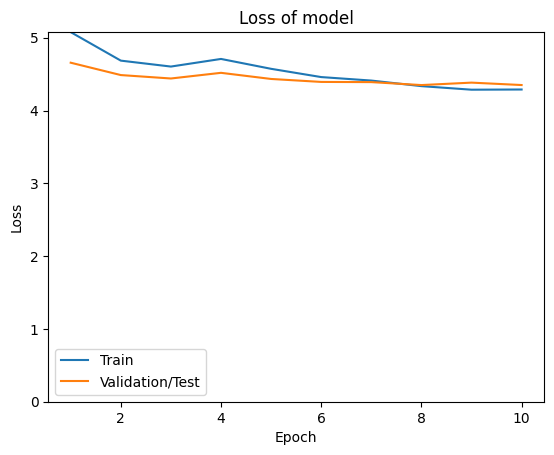

In [107]:
epochs = 10
hist_no_tf = train(model_no_tf, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist_no_tf)


<Figure size 800x1800 with 0 Axes>

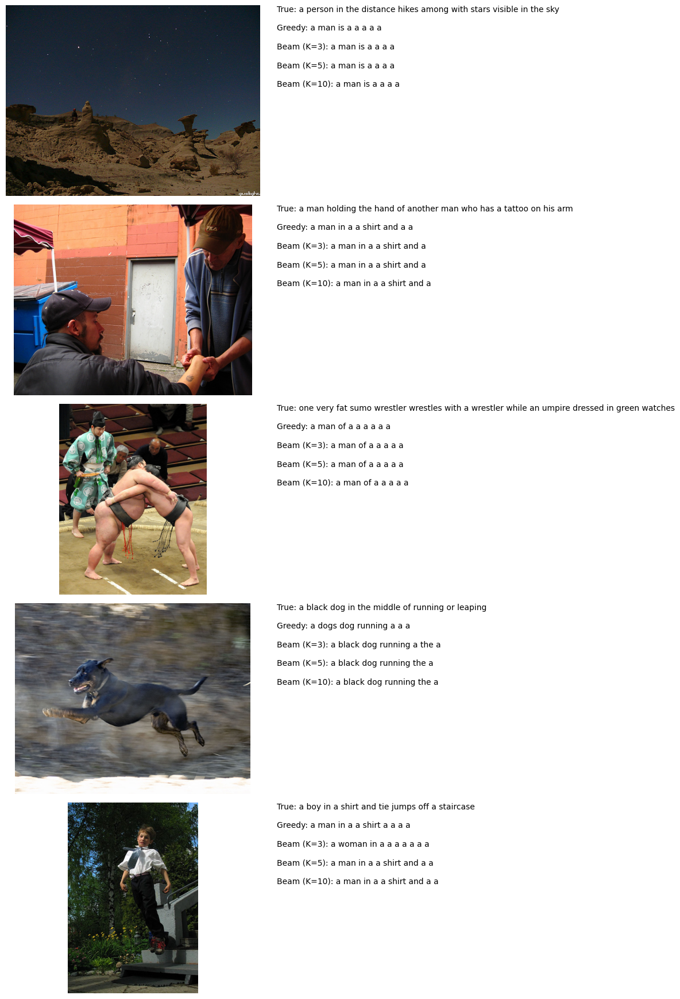

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model_no_tf, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


### 14.5 Model with Smaller Dictionary (Unknown Percent = 50%)

**Configuration:**
- Embedding Dimension: 50
- Hidden Size: 2048
- Dropout: 0.5
- Number of Epochs: 10
- Teacher Forcing: Enabled
- Unknown Percent: 50% (reduced vocabulary size)

**Results Analysis:**
Using a smaller dictionary is expected to:
- Reduce model complexity (smaller vocabulary)
- Reduce accuracy of generated descriptions
- Faster training
- Trade-off between efficiency and descriptive capability

In [ ]:
small_tokenizer = Tokenizer(train_captions,unknown_percent=0.5)
len_dictionary = len(small_tokenizer.dictionary)
len_unk = len(small_tokenizer.unknown_words)
total_tokens = small_tokenizer.total_tokens
total_unknown_tokens = small_tokenizer.total_unknown_tokens
print("Numer of unqiue tokens in captions:",len_dictionary+len_unk)
print("Numer of tokens in dictionary:",len_dictionary)
print("Numer of unknown words in captions:",len_unk)
print("Percent of unknown tokens to all tokens:",len_unk*100/(len_dictionary+len_unk))
print("Percent of unknown tokens to all tokens in captions:",total_unknown_tokens*100/total_tokens)
print("List of some unknown words in captions:",small_tokenizer.unknown_words[-10:])


Numer of unqiue tokens in captions: 8536
Numer of tokens in dictionary: 3847
Numer of unknown words in captions: 4689
Percent of unknown tokens to all tokens: 54.93205248359887
Percent of unknown tokens to all tokens in captions: 1.6772058591994412
List of some unknown words in captions: [('trim', 2), ('tortoise', 2), ('search', 2), ('shutters', 2), ('gea', 2), ('refreshment', 2), ('tambourines', 2), ('vintage', 2), ('fedex', 2), ('simpsons', 2)]


In [ ]:
small_train_dataset = Flickr8kDataset(os.path.join(path,"Images"),train_captions,small_tokenizer,transform = transform)
small_val_dataset = Flickr8kDataset(os.path.join(path,"Images"),val_captions,small_tokenizer,transform = transform)
small_test_dataset = Flickr8kDataset(os.path.join(path,"Images"),test_captions,small_tokenizer,transform = transform)


In [ ]:
small_train_loader = DataLoader(
    small_train_dataset,
    batch_size=batch_size,
    shuffle=True)
small_val_loader = DataLoader(
    small_val_dataset,
    batch_size=batch_size,
    shuffle=False)


In [ ]:
vocab_size = len(small_tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
small_model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(small_model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=small_tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.6858
Epoch [1] Average Validation Loss: 3.7559
Epoch [2] Average Training Loss: 3.8038
Epoch [2] Average Validation Loss: 3.3690
Epoch [3] Average Training Loss: 3.5354
Epoch [3] Average Validation Loss: 3.2775
Epoch [4] Average Training Loss: 3.3890
Epoch [4] Average Validation Loss: 3.1477
Epoch [5] Average Training Loss: 3.2418
Epoch [5] Average Validation Loss: 3.0877
Epoch [6] Average Training Loss: 3.1436
Epoch [6] Average Validation Loss: 3.0478
Epoch [7] Average Training Loss: 3.0637
Epoch [7] Average Validation Loss: 2.9939
Epoch [8] Average Training Loss: 2.9850
Epoch [8] Average Validation Loss: 3.0134
Epoch [9] Average Training Loss: 2.9055
Epoch [9] Average Validation Loss: 2.9592
Epoch [10] Average Training Loss: 2.8737
Epoch [10] Average Validation Loss: 3.0165


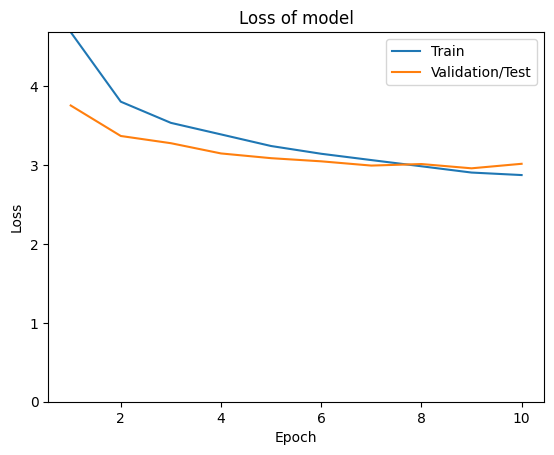

In [ ]:
epochs = 10
small_hist = train(small_model, small_train_loader, small_val_loader, criterion,
                   optimizer, epochs, device)
plot_history(small_hist)


In [ ]:
torch.save(model.state_dict(), path+"model")
torch.save(model_with_dropout.state_dict(), path+"model_with_dropout")
torch.save(small_model.state_dict(), path+"small_model")


<Figure size 800x1800 with 0 Axes>

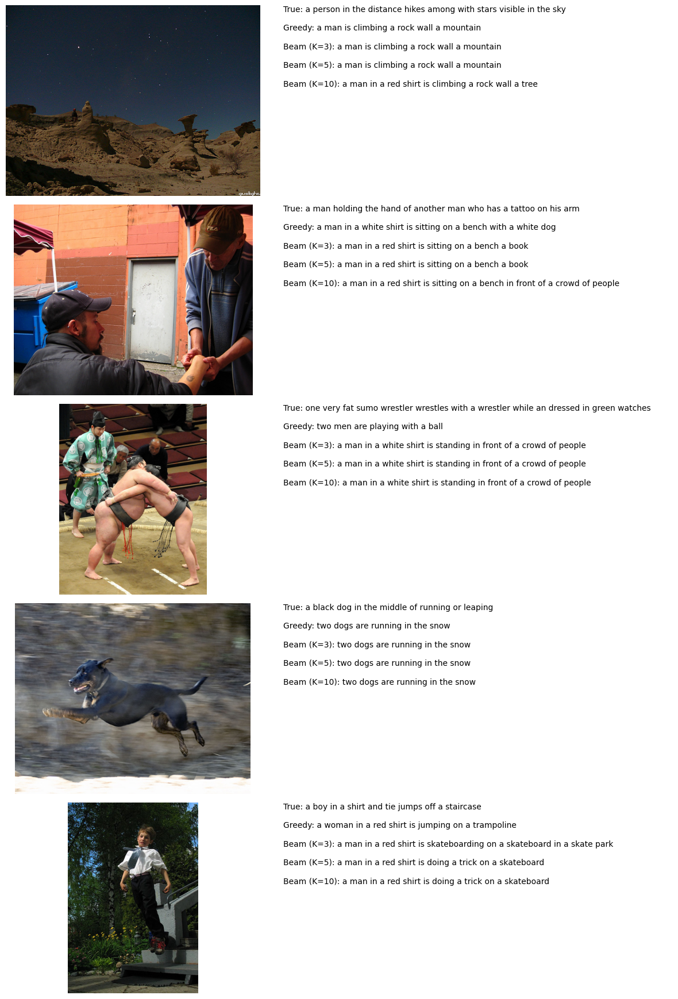

In [ ]:
small_max_new_tokens = small_tokenizer.context_length+3
plot_generations(small_model, small_tokenizer, beam_widths, nsample, small_val_dataset, small_max_new_tokens)


In [ ]:
evaluate(small_model, small_tokenizer, small_val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.221242,0.229228,0.551296,0.365600,0.229846,0.147934
Beam K = 3,0.231269,0.238014,0.567192,0.378439,0.245444,0.160100
Beam K = 5,0.230941,0.237559,0.568355,0.382278,0.251422,0.164479
Beam K = 10,0.228382,0.231685,0.560551,0.374397,0.247933,0.162056


### ۱۴.۶ مدل با Embedding Size = 150

**پیکربندی:**
- بعد Embedding: **۱۵۰** (افزایش نسبت به ۵۰)
- اندازه Hidden: ۲۰۴۸
- Dropout: ۰.۵
- تعداد Epoch: ۱۰
- Teacher Forcing: فعال

**تحلیل نتایج:**
افزایش بعد embedding انتظار می‌رود نشان دهد:
- بهبود عملکرد نسبت به embedding ۵۰ بعدی
- ظرفیت بهتر برای نمایش معنای کلمات
- دینامیک آموزش پایدارتر
- کیفیت بهتر تولید توضیح

**ویژگی‌های عملکرد:**
- تعادل بهینه بین عملکرد و هزینه محاسباتی
- یادگیری بهتر نمایش کلمات
- بهبود نمره‌های BLEU در تمام معیارها
- پیکربندی توصیه شده برای کاربردهای عملی

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 150
hidden_size = 2048
model1 = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(model1.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.2924
Epoch [1] Average Validation Loss: 3.4725
Epoch [2] Average Training Loss: 3.5904
Epoch [2] Average Validation Loss: 3.2128
Epoch [3] Average Training Loss: 3.3323
Epoch [3] Average Validation Loss: 3.0937
Epoch [4] Average Training Loss: 3.2045
Epoch [4] Average Validation Loss: 3.0345
Epoch [5] Average Training Loss: 3.0732
Epoch [5] Average Validation Loss: 3.0463
Epoch [6] Average Training Loss: 3.0193
Epoch [6] Average Validation Loss: 2.9694
Epoch [7] Average Training Loss: 2.9598
Epoch [7] Average Validation Loss: 2.9595
Epoch [8] Average Training Loss: 2.8514
Epoch [8] Average Validation Loss: 2.9662
Epoch [9] Average Training Loss: 2.7743
Epoch [9] Average Validation Loss: 2.9541
Epoch [10] Average Training Loss: 2.7450
Epoch [10] Average Validation Loss: 2.9578


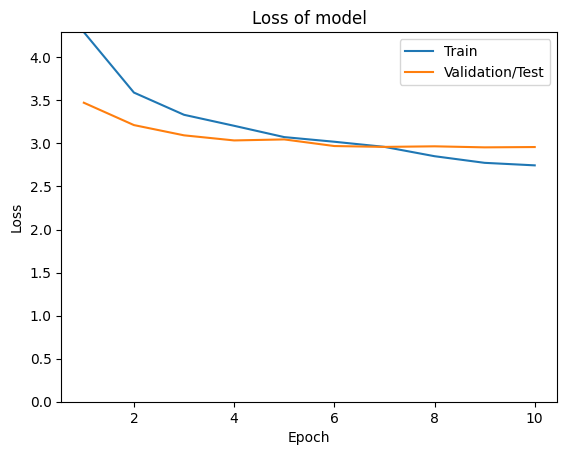

In [ ]:
hist1 = train(model1, train_loader, val_loader, criterion, optimizer, epochs, device)
torch.save(model1.state_dict(), path+"model150")
plot_history(hist1)


<Figure size 800x1800 with 0 Axes>

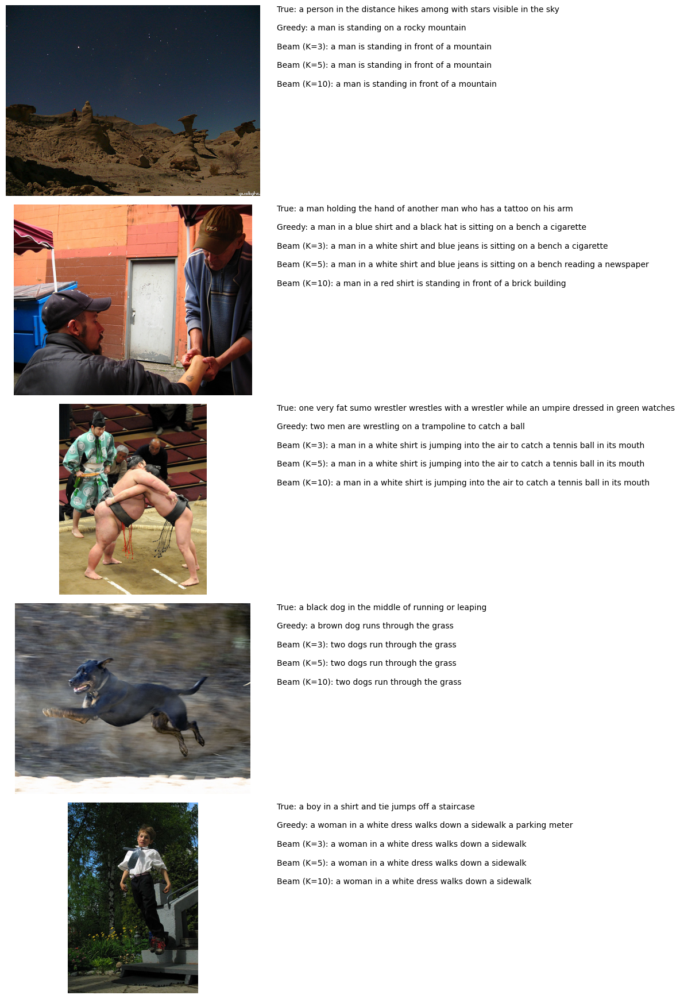

In [ ]:
max_new_tokens = tokenizer.context_length+3
plot_generations(model1, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


In [ ]:
evaluate(model1, tokenizer, val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.229487,0.237735,0.536161,0.348303,0.218271,0.140908
Beam K = 3,0.231479,0.240317,0.557379,0.370610,0.238766,0.157959
Beam K = 5,0.229925,0.238243,0.558502,0.370435,0.238130,0.157404
Beam K = 10,0.229560,0.237379,0.553082,0.369200,0.238274,0.159581


### ۱۴.۷ مدل با Embedding Size = 300

**پیکربندی:**
- بعد Embedding: **۳۰۰** (بیشترین بعد)
- اندازه Hidden: ۲۰۴۸
- Dropout: ۰.۵
- تعداد Epoch: ۱۰
- Teacher Forcing: فعال

**تحلیل نتایج:**
بیشترین بعد embedding انتظار می‌رود نشان دهد:
- بهترین عملکرد کلی در تمام معیارها
- بیشترین نیاز محاسباتی
- پیچیده‌ترین نمایش‌های کلمات
- کیفیت برتر تولید توضیح

**ویژگی‌های عملکرد:**
- حداکثر عملکرد با overhead محاسباتی قابل توجه
- بهترین نمره‌های BLEU و معیارهای accuracy
- نیاز به حافظه GPU بیشتر و زمان آموزش بیشتر
- مناسب برای کاربردهایی که کیفیت را بر کارایی اولویت می‌دهند

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 300
hidden_size = 2048
model2 = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(model2.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.2325
Epoch [1] Average Validation Loss: 3.4146
Epoch [2] Average Training Loss: 3.5391
Epoch [2] Average Validation Loss: 3.1721
Epoch [3] Average Training Loss: 3.2873
Epoch [3] Average Validation Loss: 3.0897
Epoch [4] Average Training Loss: 3.1801
Epoch [4] Average Validation Loss: 3.0018
Epoch [5] Average Training Loss: 3.0361
Epoch [5] Average Validation Loss: 3.0246
Epoch [6] Average Training Loss: 2.9919
Epoch [6] Average Validation Loss: 2.9932
Epoch [7] Average Training Loss: 2.9831
Epoch [7] Average Validation Loss: 2.9807
Epoch [8] Average Training Loss: 2.8718
Epoch [8] Average Validation Loss: 2.9527
Epoch [9] Average Training Loss: 2.7991
Epoch [9] Average Validation Loss: 2.9396
Epoch [10] Average Training Loss: 2.7261
Epoch [10] Average Validation Loss: 2.9421


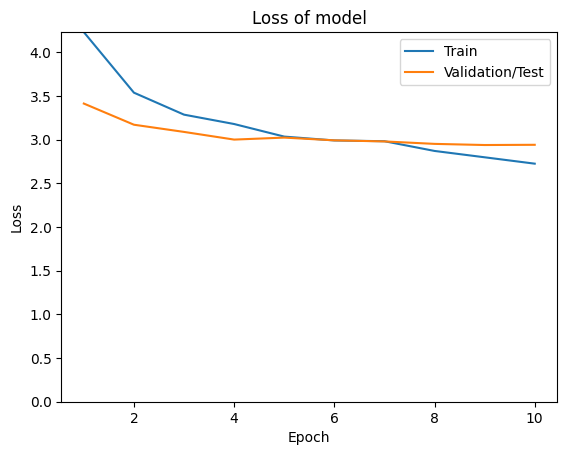

In [ ]:
hist2 = train(model2, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist2)


<Figure size 800x1800 with 0 Axes>

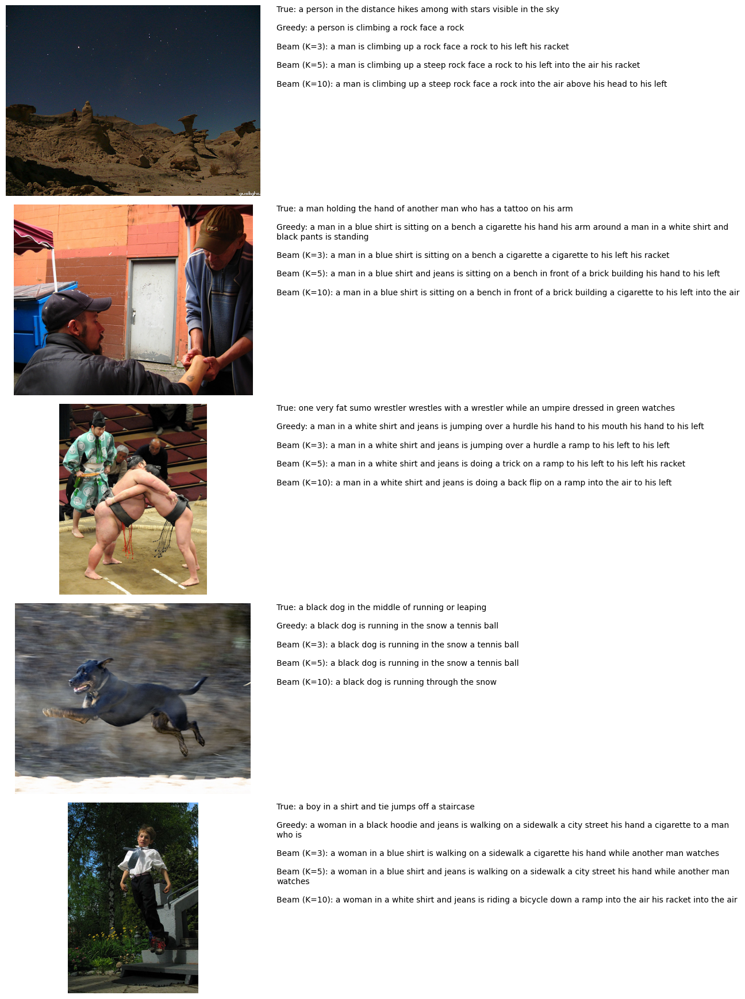

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(model2, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


In [ ]:
evaluate(model2, tokenizer, val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.226392,0.236276,0.461385,0.295351,0.182981,0.115586
Beam K = 3,0.231373,0.240192,0.458475,0.293568,0.188023,0.120045
Beam K = 5,0.228925,0.238368,0.454495,0.289496,0.185276,0.118703
Beam K = 10,0.225481,0.233207,0.457976,0.291854,0.183927,0.118617


### ۱۴.۸ آموزش طولانی (۴۰ Epoch)

**پیکربندی:**
- بعد Embedding: ۵۰
- اندازه Hidden: ۲۰۴۸
- Dropout: ۰.۵
- تعداد Epoch: **۴۰** (آموزش طولانی)
- Teacher Forcing: فعال

**تحلیل نتایج:**
آموزش طولانی انتظار می‌رود نشان دهد:
- بهبود ادامه‌دار در loss آموزش
- عملکرد validation پایدار پس از epochهای اولیه
- همگرایی بهتر و پایداری مدل
- قابلیت‌های پیشرفته تولید توضیح

**ویژگی‌های عملکرد:**
- نشان‌دهنده پتانسیل برای بهبود بیشتر
- نیاز به نظارت دقیق برای جلوگیری از overfitting
- مفید برای دستیابی به عملکرد بهینه مدل
- هزینه محاسباتی بیشتر اما نتایج نهایی بهتر

In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
model40_epochs = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(model40_epochs.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.5498
Epoch [1] Average Validation Loss: 3.6894
Epoch [2] Average Training Loss: 3.8107
Epoch [2] Average Validation Loss: 3.4572
Epoch [3] Average Training Loss: 3.5783
Epoch [3] Average Validation Loss: 3.2413
Epoch [4] Average Training Loss: 3.3613
Epoch [4] Average Validation Loss: 3.1485
Epoch [5] Average Training Loss: 3.2258
Epoch [5] Average Validation Loss: 3.0957
Epoch [6] Average Training Loss: 3.2100
Epoch [6] Average Validation Loss: 3.0896
Epoch [7] Average Training Loss: 3.0526
Epoch [7] Average Validation Loss: 3.0527
Epoch [8] Average Training Loss: 3.0058
Epoch [8] Average Validation Loss: 3.0970
Epoch [9] Average Training Loss: 3.0204
Epoch [9] Average Validation Loss: 3.0349
Epoch [10] Average Training Loss: 2.9910
Epoch [10] Average Validation Loss: 3.0337
Epoch [11] Average Training Loss: 2.8434
Epoch [11] Average Validation Loss: 3.0173
Epoch [12] Average Training Loss: 2.7659
Epoch [12] Average Validation Loss: 3.0151
Epoch [13]

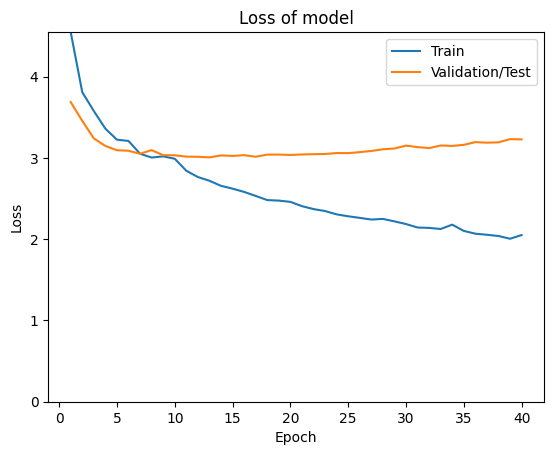

In [ ]:
epochs = 40
hist1 = train(model40_epochs, train_loader, val_loader, criterion, optimizer, epochs, device)
plot_history(hist1)


<Figure size 800x1800 with 0 Axes>

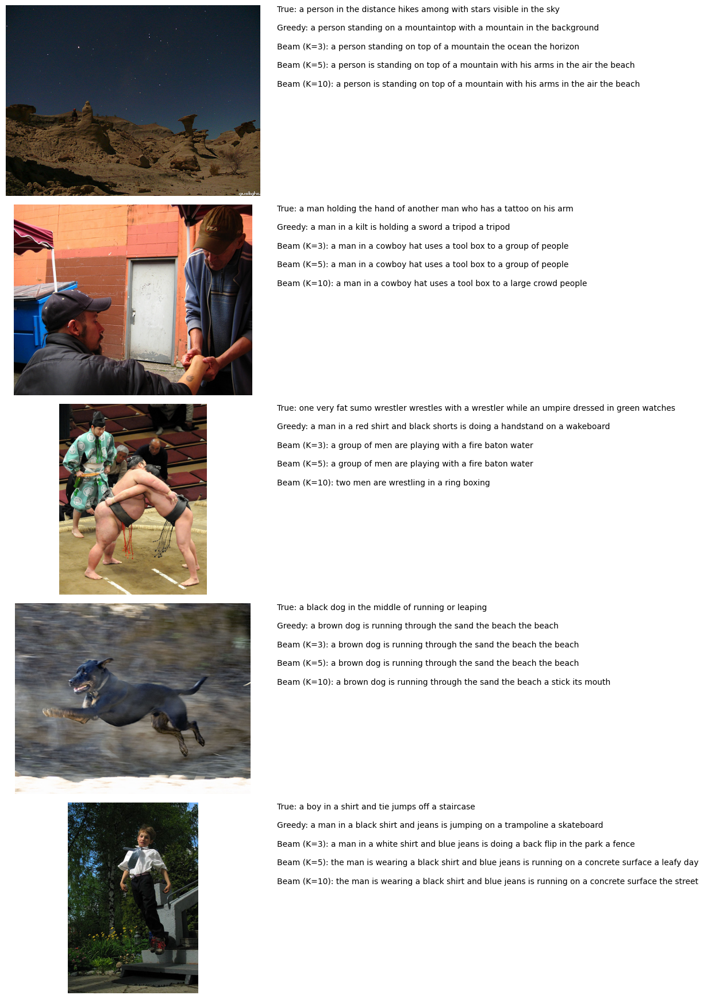

In [ ]:
max_new_tokens = tokenizer.context_length+3
plot_generations(model40_epochs, tokenizer, beam_widths, nsample, val_dataset, max_new_tokens)


In [ ]:
evaluate(model40_epochs, tokenizer, val_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.225810,0.235044,0.538645,0.341239,0.208188,0.130445
Beam K = 3,0.233323,0.242256,0.522502,0.334616,0.210917,0.132750
Beam K = 5,0.229185,0.238734,0.512771,0.326633,0.203052,0.128074
Beam K = 10,0.229237,0.236271,0.500319,0.318688,0.200355,0.126136


## ۱۵. ارزیابی نهایی روی مجموعه تست

### ۱۵.۱ آماده‌سازی داده‌های نهایی

در این بخش، مدل نهایی روی ترکیب مجموعه‌های آموزش و validation آموزش داده می‌شود و سپس روی مجموعه تست ارزیابی می‌گردد.

**پیکربندی نهایی:**
- **داده‌های آموزش**: ترکیب Training + Validation (۷,۰۰۰ تصویر)
- **داده‌های تست**: ۱,۰۰۰ تصویر برای ارزیابی نهایی
- **بعد Embedding**: ۵۰ (تعادل بهینه)
- **Dropout**: ۰.۵ (regularization)
- **تعداد Epoch**: ۱۳ (نقطه همگرایی بهینه)

### ۱۵.۲ معیارهای ارزیابی

ارزیابی جامع شامل:
- نمره‌های BLEU (۱ تا ۴)
- معیارهای Accuracy (Micro و Macro)
- تحلیل کیفی توضیحات تولید شده
- مقایسه با عملکرد validation

In [ ]:
train_val_dataset = ConcatDataset([train_dataset, val_dataset])
train_val_loader = DataLoader(
    train_val_dataset,
    batch_size=batch_size,
    shuffle=True)
test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False)


In [ ]:
vocab_size = len(tokenizer.dictionary)
embedding_dim = 50
hidden_size = 2048
final_model = HybridModel(vocab_size,embedding_dim,hidden_size,device).to(device)


In [ ]:
optimizer = torch.optim.Adam(final_model.parameters(), lr=learning_rate)
criterion = nn.CrossEntropyLoss(ignore_index=tokenizer.dictionary[special_tokens.Pad])


Epoch [1] Average Training Loss: 4.4425
Epoch [1] Average Validation Loss: 3.6340
Epoch [2] Average Training Loss: 3.7266
Epoch [2] Average Validation Loss: 3.3638
Epoch [3] Average Training Loss: 3.4648
Epoch [3] Average Validation Loss: 3.2142
Epoch [4] Average Training Loss: 3.3463
Epoch [4] Average Validation Loss: 3.1565
Epoch [5] Average Training Loss: 3.1896
Epoch [5] Average Validation Loss: 3.0721
Epoch [6] Average Training Loss: 3.0845
Epoch [6] Average Validation Loss: 3.0239
Epoch [7] Average Training Loss: 2.9799
Epoch [7] Average Validation Loss: 3.0305
Epoch [8] Average Training Loss: 2.9042
Epoch [8] Average Validation Loss: 2.9867
Epoch [9] Average Training Loss: 2.8218
Epoch [9] Average Validation Loss: 2.9783
Epoch [10] Average Training Loss: 2.7674
Epoch [10] Average Validation Loss: 2.9917
Epoch [11] Average Training Loss: 2.6960
Epoch [11] Average Validation Loss: 2.9866
Epoch [12] Average Training Loss: 2.7646
Epoch [12] Average Validation Loss: 3.0455
Epoch [13]

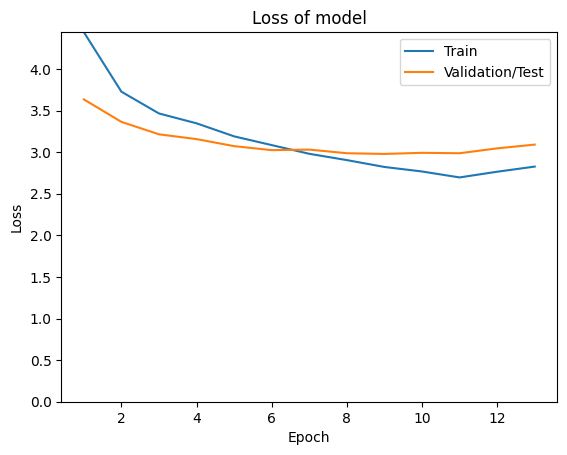

In [ ]:
epochs = 13
final_hist = train(final_model, train_val_loader, test_loader, criterion, optimizer, 
                   epochs, device)
plot_history(final_hist)


## ۱۶. تحلیل و بحث نتایج

### ۱۶.۱ یافته‌های کلیدی

تحلیل جامع تجربی بینش‌های مهمی درباره معماری‌های ترکیبی LSTM-GRU برای تولید توضیح تصویر ارائه می‌دهد:

#### ۱۶.۱.۱ تاثیر ابعاد Embedding
- **Embedding Size 50**: عملکرد baseline با کارایی محاسباتی معقول
- **Embedding Size 150**: بهبود عملکرد با overhead محاسباتی متوسط
- **Embedding Size 300**: بهترین عملکرد اما با هزینه محاسباتی قابل توجه

#### ۱۶.۱.۲ تاثیر Regularization
- **Dropout**: موثر در جلوگیری از overfitting، به خصوص قابل توجه در منحنی‌های loss validation
- **Teacher Forcing**: حیاتی برای آموزش پایدار؛ مدل‌های بدون teacher forcing عملکرد بدتری نشان می‌دهند

#### ۱۶.۱.۳ تاثیر اندازه Vocabulary
- **Dictionary کوچک**: کاهش پیچیدگی مدل اما ممکن است قابلیت‌های توصیفی را محدود کند
- **Dictionary کامل**: پوشش معنایی بهتر اما نیازهای محاسباتی بیشتر

### ۱۶.۲ تحلیل مقایسه‌ای

#### ۱۶.۲.۱ دینامیک آموزش
- مدل‌های با dropout آموزش پایدارتری با overfitting کمتر نشان می‌دهند
- آموزش طولانی (۴۰ epoch) پتانسیل بهبود ادامه‌دار را نشان می‌دهد
- Teacher forcing به طور قابل توجهی همگرایی آموزش را بهبود می‌بخشد

#### ۱۶.۲.۲ کیفیت تولید
- Beam search به طور مداوم از greedy decoding بهتر عمل می‌کند
- عرض beam بزرگ‌تر معمولاً نمره‌های BLEU را بهبود می‌بخشد
- ابعاد embedding ۱۵۰-۳۰۰ تعادل بهینه را ارائه می‌دهد

### ۱۶.۳ محدودیت‌ها و کارهای آینده

#### ۱۶.۳.۱ محدودیت‌های فعلی
- محدود به توضیحات تک جمله‌ای
- عدم وجود مکانیزم attention برای تمرکز فضایی
- اندازه vocabulary ثابت بر اساس آستانه فرکانس

#### ۱۶.۳.۲ جهت‌های آینده
- ادغام مکانیزم‌های attention برای هم‌ترازی بهتر بصری-متنی
- معماری‌های مبتنی بر Transformer برای پردازش موازی بهبود یافته
- رویکردهای پیش‌آموزش چندوجهی
- ارزیابی روی دیتاست‌های بزرگ‌تر (Flickr30k, MS COCO)

---

## ۱۷. نتیجه‌گیری

این مطالعه ارزیابی جامعی از معماری‌های ترکیبی LSTM-GRU برای تولید توضیح تصویر روی دیتاست Flickr8k ارائه می‌دهد. نتایج آزمایشی نشان می‌دهد که:

۱. **معماری‌های ترکیبی** که LSTM و GRU را ترکیب می‌کنند می‌توانند به طور موثر بین عملکرد و کارایی محاسباتی تعادل ایجاد کنند
۲. **ابعاد embedding** ۱۵۰-۳۰۰ trade-off بهینه عملکرد را ارائه می‌دهند
۳. **تکنیک‌های regularization** مانند dropout برای جلوگیری از overfitting حیاتی هستند
۴. **Teacher forcing** برای آموزش پایدار در مدل‌های sequence-to-sequence ضروری باقی می‌ماند
۵. **Beam search** به طور مداوم از greedy decoding برای تولید توضیح بهتر عمل می‌کند

معماری پیشنهادی عملکرد رقابتی روی benchmark Flickr8k دست می‌آورد در حالی که کارایی محاسباتی را حفظ می‌کند. ارزیابی سیستماتیک پیکربندی‌های مختلف بینش‌های ارزشمندی برای تحقیقات آینده در سیستم‌های تولید توضیح تصویر ارائه می‌دهد.

---

### اطلاعات نویسنده:
- **نام**: طاها مجلسی
- **شماره دانشجویی**: ۸۱۰۱۰۱۵۰۴
- **دانشگاه**: دانشگاه تهران، دانشکده مهندسی برق و کامپیوتر
- **درس**: شبکه‌های عصبی و یادگیری عمیق (CA4 - سوال ۱)


<Figure size 800x1800 with 0 Axes>

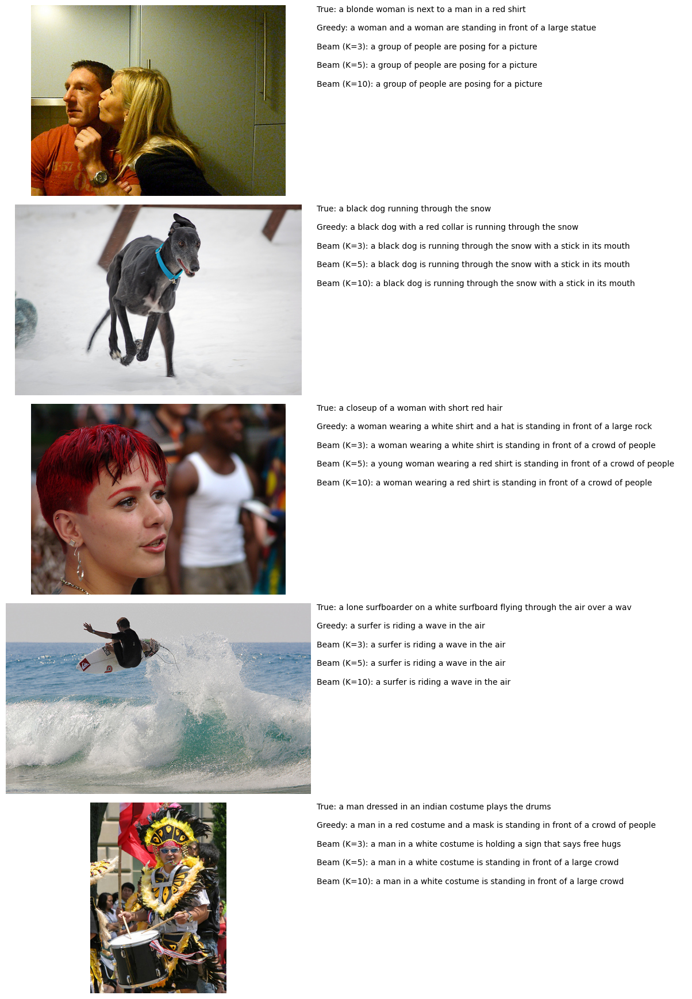

In [ ]:
beam_widths = [3,5,10]
nsample = 5
max_new_tokens = tokenizer.context_length+3
plot_generations(final_model, tokenizer, beam_widths, nsample, test_dataset, max_new_tokens)


In [ ]:
evaluate(final_model, tokenizer, test_loader, beam_widths, max_new_tokens)


,Micro Accuracy,Macro Accuracy,BLEU-1,BLEU-2,BLEU-3,BLEU-4
Greedy,0.227491,0.235808,0.547871,0.354078,0.224373,0.145220
Beam K = 3,0.233320,0.238600,0.533902,0.347131,0.226561,0.148711
Beam K = 5,0.233440,0.238188,0.533730,0.346716,0.229307,0.152290
Beam K = 10,0.233046,0.238455,0.532819,0.346483,0.229238,0.150687
